In [1]:
# import libraries

import os
import sys
import configparser
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torchvision
from torchvision.transforms import RandomAffine
from torchvision.utils import make_grid

In [2]:
# set the device

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Device is:', device)

Device is: cuda


In [3]:
# set the hyperparameters

config = configparser.ConfigParser()
config['CNN'] = {'rand_seed': 765, 'ks': 3, 'nf0': 15, 'nf1': 45, 'nf2': 128, 'nf3': 196, 'nf4': 128, 'nf5': 128, 'nf6': 128,
                 'nfc': 16}
config['IMSAT'] = {'lambda_affine': 0.03, 'lambda_autoencoder': 1.0, 'lambda_entropy_marginal': 0.1,
                   'lambda_entropy_mean': 0.03, 'learning_rate': 0.003}

In [4]:
rand_seed = int(config['CNN']['rand_seed'])
ks        = int(config['CNN']['ks'])
nf0       = int(config['CNN']['nf0'])
nf1       = int(config['CNN']['nf1'])
nf2       = int(config['CNN']['nf2'])
nf3       = int(config['CNN']['nf3'])
nf4       = int(config['CNN']['nf4'])
nf5       = int(config['CNN']['nf5'])
nf6       = int(config['CNN']['nf6'])
nfc       = int(config['CNN']['nfc'])

In [5]:
lambda_affine           = float(config['IMSAT']['lambda_affine'])
lambda_autoencoder      = float(config['IMSAT']['lambda_autoencoder'])
lambda_entropy_marginal = float(config['IMSAT']['lambda_entropy_marginal'])
lambda_entropy_mean     = float(config['IMSAT']['lambda_entropy_mean'])
learning_rate           = float(config['IMSAT']['learning_rate'])

In [6]:
# set random seed

print('random seed:', rand_seed)

torch.manual_seed(rand_seed)
torch.cuda.manual_seed(rand_seed)
np.random.seed(rand_seed)

random seed: 765


In [7]:
# load the dataset

data_src = np.load('/project/dsc-is/nono/Documents/kpc/dat0/slice128_Block2_11K.npy')

In [8]:
# custom functions to extract batches of samples

def get_batch_index_iii(iii, batch_size = None, shuffle = True):
    if (shuffle):
        np.random.shuffle(iii)
    if (batch_size is not None):
        n_batch = len(iii) // batch_size
    batch_list = np.array_split(iii, n_batch)
    return batch_list
def get_batch_index_nn(nn, batch_size = None, shuffle = True):
    iii = np.arange(nn)
    batch_list = get_batch_index_iii(iii, batch_size = batch_size, shuffle = shuffle)
    return batch_list

In [9]:
ix, iy = 64, 64 # 128x128 patches are getting rescaled

# affine transformation
add_random_affine = RandomAffine(degrees = 5, translate = (0.05, 0.05), scale = (0.95, 1.05), fill = (161, 138, 172))
def generate_batch(iii, src, device, random_affine = False):
    if (random_affine):
        tmp = np.empty((len(iii), ix, iy, nf0))
        for aa, ii in enumerate(iii):
            img_tmp0 = Image.fromarray(src[ii, 0])
            img_tmp0 = add_random_affine(img_tmp0).resize((ix, iy)) # HE
            img_tmp4 = Image.fromarray(src[ii, 4])
            img_tmp4 = add_random_affine(img_tmp4).resize((ix, iy)) # CD31
            img_tmp5 = Image.fromarray(src[ii, 5])
            img_tmp5 = add_random_affine(img_tmp5).resize((ix, iy)) # CK19
            img_tmp6 = Image.fromarray(src[ii, 6])
            img_tmp6 = add_random_affine(img_tmp6).resize((ix, iy)) # Ki67
            img_tmp7 = Image.fromarray(src[ii, 7])
            img_tmp7 = add_random_affine(img_tmp7).resize((ix, iy)) # MT
            tmp[aa] = np.concatenate((img_tmp0,img_tmp4, img_tmp5, img_tmp6, img_tmp7), axis = 2)
        xxx = torch.tensor(tmp / 256.0, dtype = torch.float32).permute(0, 3, 2, 1)
    else:
        tmp = np.empty((len(iii), ix, iy, nf0))
        for aa, ii in enumerate(iii):
            img_tmp0 = Image.fromarray(src[ii, 0]).resize((ix, iy)) # HE
            img_tmp4 = Image.fromarray(src[ii, 4]).resize((ix, iy)) # CD31
            img_tmp5 = Image.fromarray(src[ii, 5]).resize((ix, iy)) # CK19
            img_tmp6 = Image.fromarray(src[ii, 6]).resize((ix, iy)) # Ki67
            img_tmp7 = Image.fromarray(src[ii, 7]).resize((ix, iy)) # MT
            tmp[aa] = np.concatenate((img_tmp0,img_tmp4, img_tmp5, img_tmp6, img_tmp7), axis = 2)
        xxx = torch.tensor(tmp / 256.0, dtype = torch.float32).permute(0, 3, 2, 1)
    return (xxx.to(device))

In [10]:
# build encoder architecture

class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        self.encoder = nn.Sequential()
        self.encoder.add_module('conv1', nn.Conv2d(nf0, nf1, kernel_size = 4, stride = 2, padding = 1))
        self.encoder.add_module('bnor1', nn.BatchNorm2d(nf1, affine = True, track_running_stats = True))
        self.encoder.add_module('relu1', nn.LeakyReLU(0.1, inplace = True))
        self.encoder.add_module('conv2', nn.Conv2d(nf1, nf2, kernel_size = 4, stride = 2, padding = 1))
        self.encoder.add_module('bnor2', nn.BatchNorm2d(nf2, affine = True, track_running_stats = True))
        self.encoder.add_module('relu2', nn.LeakyReLU(0.1, inplace = True))
        self.encoder.add_module('conv3', nn.Conv2d(nf2, nf3, kernel_size = 4, stride = 2, padding = 1))
        self.encoder.add_module('bnor3', nn.BatchNorm2d(nf3, affine = True, track_running_stats = True))
        self.encoder.add_module('relu3', nn.LeakyReLU(0.1, inplace = True))
        self.encoder.add_module('conv4', nn.Conv2d(nf3, nf4, kernel_size = 4, stride = 2, padding = 1))
        self.encoder.add_module('bnor4', nn.BatchNorm2d(nf4, affine = True, track_running_stats = True))
        self.encoder.add_module('relu4', nn.LeakyReLU(0.1, inplace = True))
    def forward(self, xxx):
        hhh = self.encoder(xxx)
        return hhh

In [11]:
# build classifier architecture

class Classifier(nn.Module):
    def __init__(self):
        super(Classifier, self).__init__()
        self.classifier = nn.Sequential()
        self.classifier.add_module('conv1', nn.Conv2d(nf4, nf5, kernel_size = 4, stride = 1, padding = 0))
        self.classifier.add_module('bnor1', nn.BatchNorm2d(nf5, affine = True, track_running_stats = True))
        self.classifier.add_module('relu1', nn.LeakyReLU(0.1, inplace = True))
        self.classifier.add_module('conv2', nn.Conv2d(nf5, nf6, kernel_size = 1, stride = 1, padding = 0))
        self.classifier.add_module('relu2', nn.LeakyReLU(0.1, inplace = True))
        self.classifier.add_module('conv3', nn.Conv2d(nf6, nfc, kernel_size = 1, stride = 1, padding = 0))
        self.classifier.add_module('relu3', nn.LeakyReLU(0.1, inplace = True))
    def forward(self, hhh):
        vvv = self.classifier(hhh)
        return vvv

In [12]:
# build decoder architecture

class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()
        self.decoder = nn.Sequential()
        self.decoder.add_module('upsm4', nn.UpsamplingBilinear2d(scale_factor = 2))
        self.decoder.add_module('dcov4', nn.Conv2d(nf4 + nfc, nf3, kernel_size = 3, stride = 1, padding = 1))
        self.decoder.add_module('norm4', nn.BatchNorm2d(nf3, affine = True, track_running_stats = True))
        self.decoder.add_module('relu4', nn.LeakyReLU(0.1, inplace = True))
        self.decoder.add_module('upsm3', nn.UpsamplingBilinear2d(scale_factor = 2))
        self.decoder.add_module('dcov3', nn.Conv2d(nf3, nf2, kernel_size = 3, stride = 1, padding = 1))
        self.decoder.add_module('norm3', nn.BatchNorm2d(nf2, affine = True, track_running_stats = True))
        self.decoder.add_module('relu3', nn.LeakyReLU(0.1, inplace = True))
        self.decoder.add_module('upsm2', nn.UpsamplingBilinear2d(scale_factor = 2))
        self.decoder.add_module('dcov2', nn.Conv2d(nf2, nf1, kernel_size = 3, stride = 1, padding = 1))
        self.decoder.add_module('norm2', nn.BatchNorm2d(nf1, affine = True, track_running_stats = True))
        self.decoder.add_module('relu2', nn.LeakyReLU(0.1, inplace = True))
        self.decoder.add_module('upsm1', nn.UpsamplingBilinear2d(scale_factor = 2))
        self.decoder.add_module('dcov1', nn.Conv2d(nf1, nf0, kernel_size = 3, stride = 1, padding = 1))
        self.decoder.add_module('norm1', nn.BatchNorm2d(nf0, affine = True, track_running_stats = True))
        self.decoder.add_module('relu1', nn.Sigmoid())
    def forward(self, hhh, vvv):
        ccc = vvv.repeat((1, 1, ix // 16, iy // 16))
        hhh = torch.cat((hhh, ccc), dim = 1)
        yyy = self.decoder(hhh)
        return yyy

In [13]:
model_en = Encoder().to(device)
model_cl = Classifier().to(device)
model_de = Decoder().to(device)
# load models

model_en.load_state_dict(torch.load('models16/model_en_202203211747_5000.ckpt', weights_only=True))
model_cl.load_state_dict(torch.load('models16/model_cl_202203211747_5000.ckpt', weights_only=True))
model_de.load_state_dict(torch.load('models16/model_de_202203211747_5000.ckpt', weights_only=True))

<All keys matched successfully>

In [14]:
iii_batch = get_batch_index_nn(10000, batch_size = 100, shuffle = False)
hhh_list = []
with torch.no_grad():
    for iii in iii_batch:
        xxx_tmp = generate_batch(iii, data_src, device)
        model_en.eval()
        hhh_tmp = model_en(xxx_tmp)
        hhh_list.append(torch.softmax(hhh_tmp, dim = 1).detach().cpu().numpy())
    hhh = np.concatenate(hhh_list, axis = 0)
    print(hhh.shape)

(10000, 128, 4, 4)


In [15]:
a = np.mean(hhh, axis=3)
a = np.mean(a, axis=2)
a.shape # embedded features in upper latent space

(10000, 128)

In [16]:
iii_batch = get_batch_index_nn(10000, batch_size = 100, shuffle = False)
vvv_list = []
with torch.no_grad():
    for iii in iii_batch:
        xxx_tmp = generate_batch(iii, data_src, device)
        model_en.eval()
        model_cl.eval()
        hhh_tmp = model_en(xxx_tmp)
        vvv_tmp = model_cl(hhh_tmp)
        vvv_list.append(torch.softmax(vvv_tmp.reshape((-1, nfc)), dim = 1).detach().cpu().numpy())
    vvv_10k = np.concatenate(vvv_list, axis = 0)
    print(vvv_10k.shape)

(10000, 16)


In [17]:
C = []
D = []
for j in range(len(vvv_10k)):
    hemp1 = vvv_10k[j, :]
    hemp2 = np.argmax(hemp1)
    hemp3 = hemp1[hemp2]
    C.append(hemp2) # collect cluster IDs with highest probability for each patch
    D.append(hemp3) # collect highest probability of each patch

In [18]:
DF = pd.DataFrame(a)
DF['128'] = C
DF['129'] = D
# DF contains embedded features from upper latent space, cluster IDs and highest probability (of each patch)

In [ ]:
# 'HHH16 & C16 & D16.csv' file will be saved in this location ---> '/project/dsc-is/mahfujul-r/KPC_CP/kpc16'

DF.to_csv('/project/dsc-is/mahfujul-r/KPC_CP/kpc16/HHH16 & C16 & D16.csv', index=None, header=None) # save DF as a '.csv' file

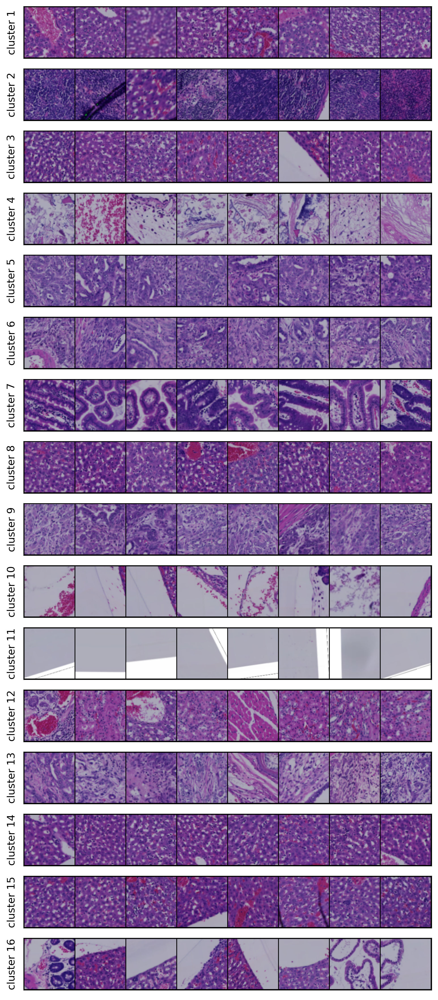

In [19]:
# clustering

fig, plts = plt.subplots(nrows=16, ncols=1)
for cc in range(nfc):
    iii = np.argsort(-vvv_10k[:, cc])
    img_tmp = []
    for aa in range(100, 108):
        img_tmp.append(torch.from_numpy(data_src[iii[aa], 0]).permute(2, 0, 1))
    grid = make_grid([img_tmp[0], img_tmp[1], img_tmp[2], img_tmp[3], img_tmp[4], img_tmp[5], img_tmp[6], img_tmp[7]])
    img = torchvision.transforms.ToPILImage()(grid)
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = ['Times New Roman'] + plt.rcParams['font.serif']
    plts[cc].imshow(img)
    plts[cc].set_ylabel('cluster {}'.format(cc + 1), fontsize = 11)
    plts[cc].set_xticks([])
    plts[cc].set_yticks([])
fig.set_size_inches((16, 19))
fig.set_dpi(300)
fig.show()